<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Imports" data-toc-modified-id="Imports-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Imports</a></span></li><li><span><a href="#Data-Augmentation/Analysis" data-toc-modified-id="Data-Augmentation/Analysis-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Data Augmentation/Analysis</a></span></li><li><span><a href="#Dataloader-creation-and-test" data-toc-modified-id="Dataloader-creation-and-test-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Dataloader creation and test</a></span></li><li><span><a href="#Model-creation" data-toc-modified-id="Model-creation-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Model creation</a></span></li><li><span><a href="#Model-Training" data-toc-modified-id="Model-Training-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Model Training</a></span><ul class="toc-item"><li><span><a href="#Model-Testing" data-toc-modified-id="Model-Testing-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Model Testing</a></span></li></ul></li></ul></div>

**GET DATA**

Summary of this notebook: ...

Definition of Done: ...

# Imports


In [1]:
import os
from os import path
import sys
import math
import cv2 # Read raw image
import glob
import random
import numpy as np
import pickle
from matplotlib import pyplot as plt
from scipy import ndimage # For rotation task or
import imutils
from skimage.color import rgb2lab, lab2rgb, rgb2gray
from skimage.io import imsave
from skimage.transform import resize
from pprint import pprint
import tqdm

import tensorflow
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.python.keras.utils import data_utils
from tensorflow.keras.preprocessing.image import Iterator
from tensorflow.keras import Input
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, UpSampling2D, AveragePooling2D, MaxPooling2D, Reshape, Conv2DTranspose, ZeroPadding2D, Add
from tensorflow.keras.layers import Activation, InputLayer, BatchNormalization
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.layers import PReLU

sys.path.append("/home/satyarth934/code/FDL_2020/training_scripts")
import utils

# Check to see if GPU is being used
print(tensorflow.test.gpu_device_name())
print("Num GPUs Available: ", tf.config.experimental.list_physical_devices('GPU'))
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

/device:GPU:0
Num GPUs Available:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
Num GPUs Available:  2


In [2]:
# DATA_PATH = "/home/satyarth934/data/nasa_impact/hurricanes/*/*"
# DATA_PATH = "/home/satyarth934/data/modis_data_products/terra/array_3bands_adapted/448/median_removed_gap_filled/*"
DATA_PATH = "/home/satyarth934/data/proxy_data/UCMerced_LandUse/Images/*/*"

NORMALIZE = True
MODEL_NAME = "baseAE_median_localRandom_in_swatch"
OUTPUT_MODEL_PATH = "/home/satyarth934/code/FDL_2020/Models/" + MODEL_NAME
TENSORBOARD_LOG_DIR = "/home/satyarth934/code/FDL_2020/tb_logs/" + MODEL_NAME
ACTIVATION_IMG_PATH = "/home/satyarth934/code/FDL_2020/activation_viz/" + MODEL_NAME
PATH_LIST_LOCATION = "/home/satyarth934/code/FDL_2020/activation_viz/" + MODEL_NAME + "/train_test_paths.npy"

NUM_EPOCHS = 200
BATCH_SIZE = 64
INTERPOLATE_DATA_GAP = False


dims = (448, 448, 3)
    
# Dataloader creation and test
img_paths = glob.glob(DATA_PATH)
print("len(img_paths):", len(img_paths))

train_split = 0.6
valid_split = 0.2
test_split = 0.2
X_train_paths = img_paths[:int(train_split * len(img_paths))]
X_valid_paths = img_paths[int(train_split * len(img_paths)):int((train_split + valid_split) * len(img_paths))]
X_test_paths = img_paths[len(img_paths) - int(test_split * len(img_paths)):]

len(img_paths): 2100


In [3]:
X_test_paths[191]

'/home/satyarth934/data/proxy_data/UCMerced_LandUse/Images/agricultural/agricultural21.tif'

Orig  0.057462985194077894 0.6700280112044823
Gen  0.0 1.0


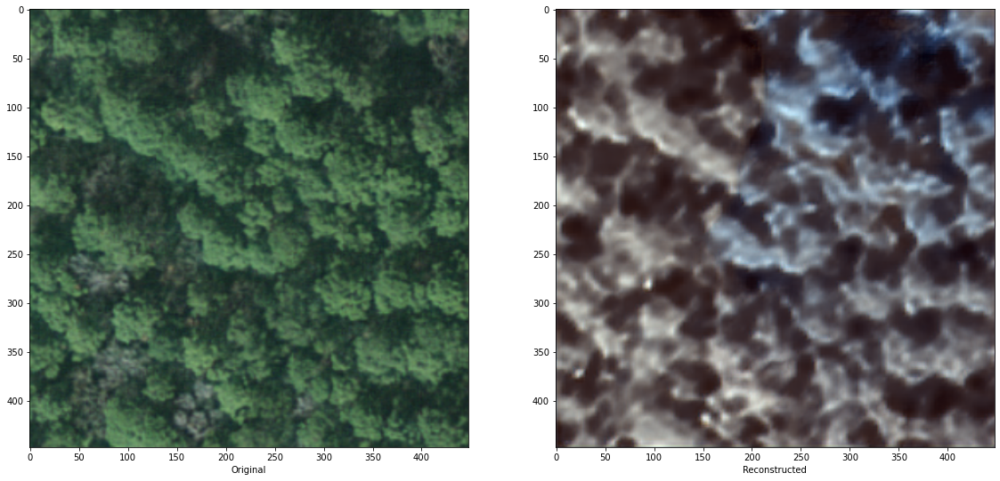

Orig  0.04103641456582503 0.9403361344537815
Gen  0.0 1.0


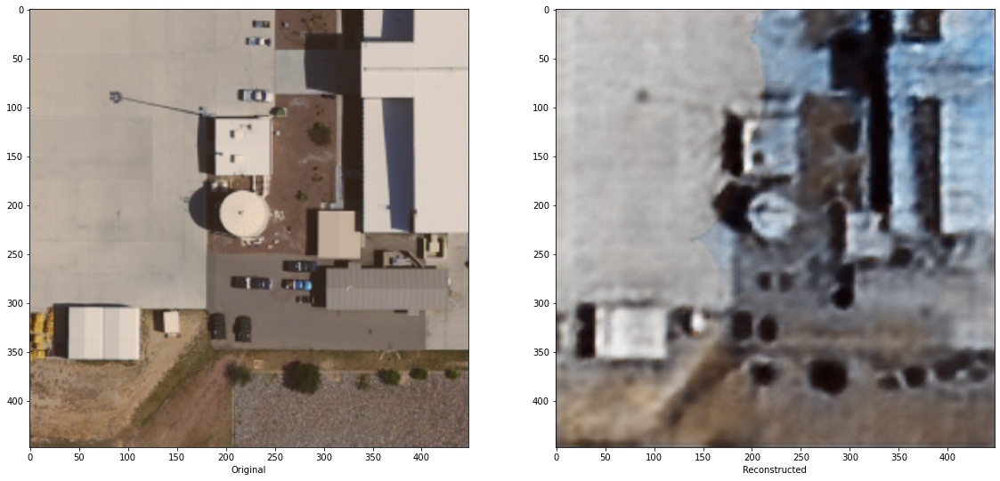

Orig  0.00916366546618988 1.0
Gen  0.0 1.0


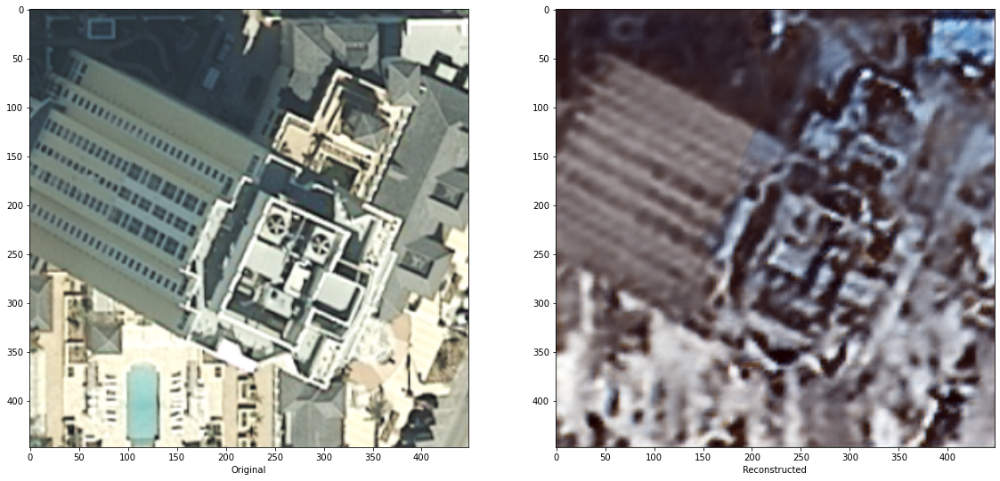

Orig  0.0039415766306522635 0.728531412565026
Gen  0.0 1.0


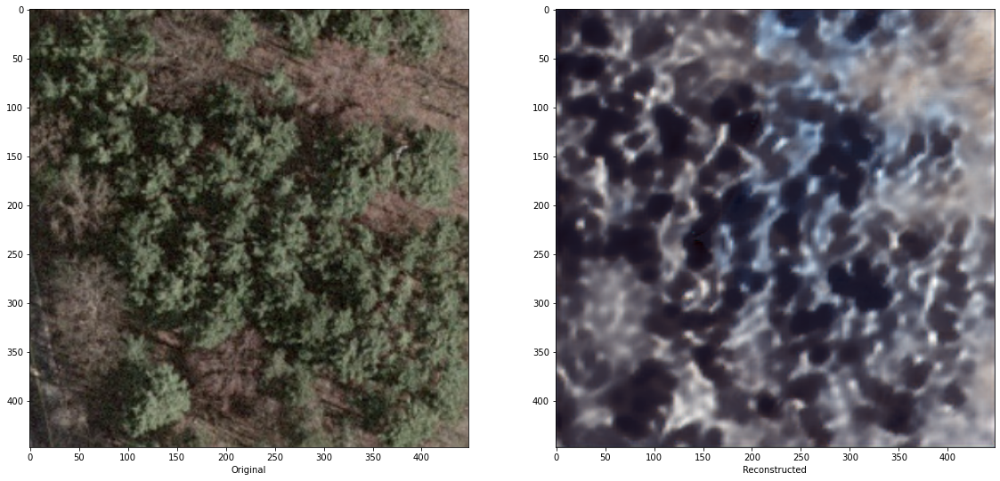

Orig  0.0 0.9989795918367346
Gen  0.0 1.0


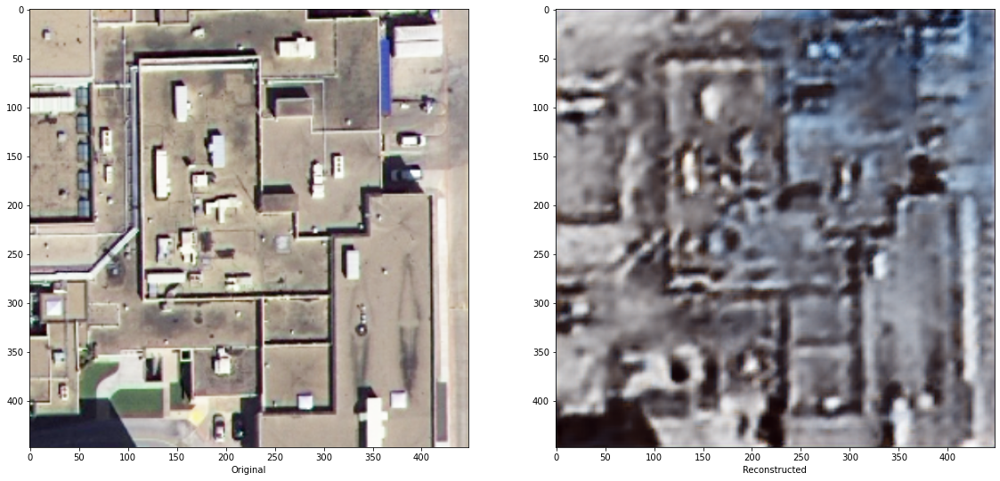

Orig  0.0 1.0
Gen  0.0 1.0


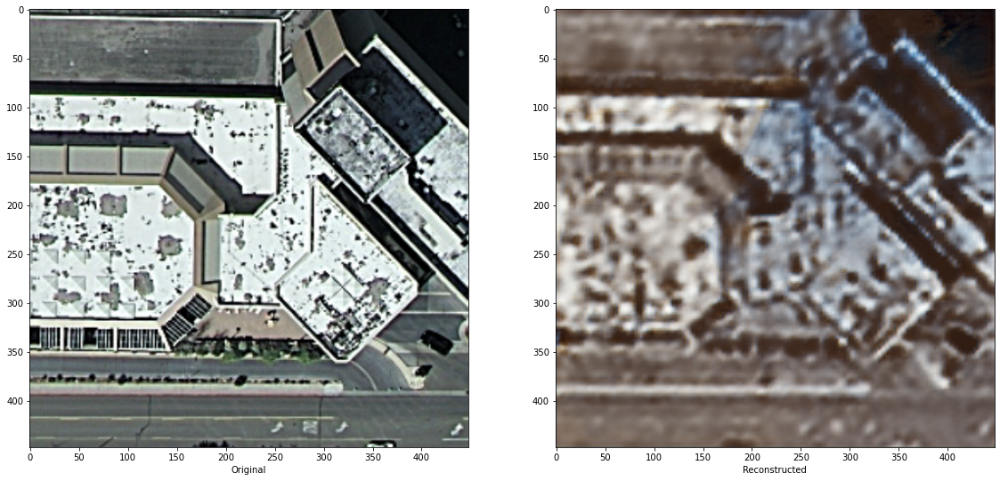

Orig  0.10860344137655008 0.9921568627450981
Gen  0.0 1.0


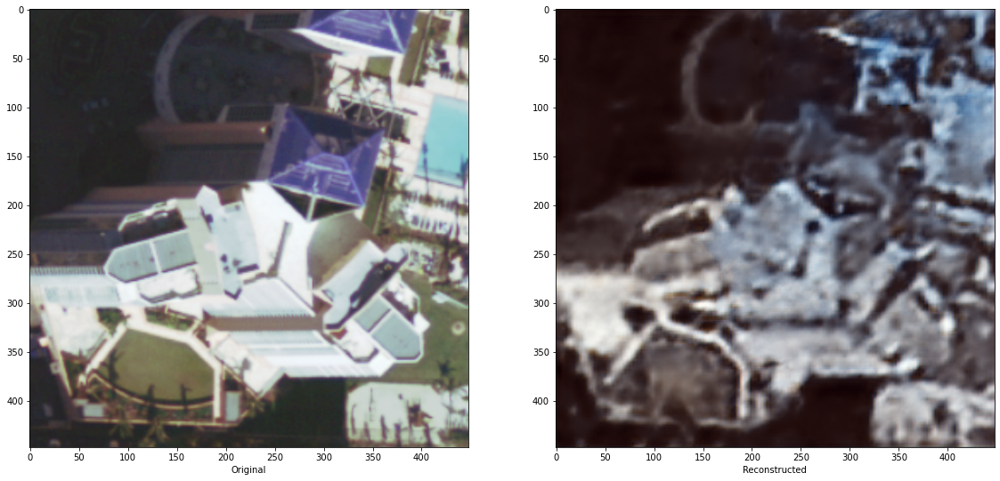

Orig  0.0 1.0
Gen  0.0 1.0


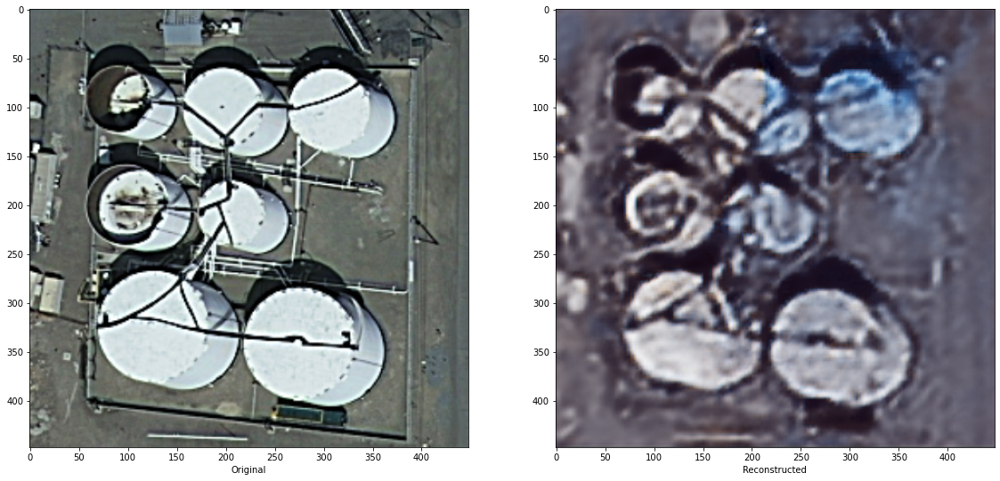

Orig  0.3138055222088838 0.7160864345738289
Gen  0.0 1.0


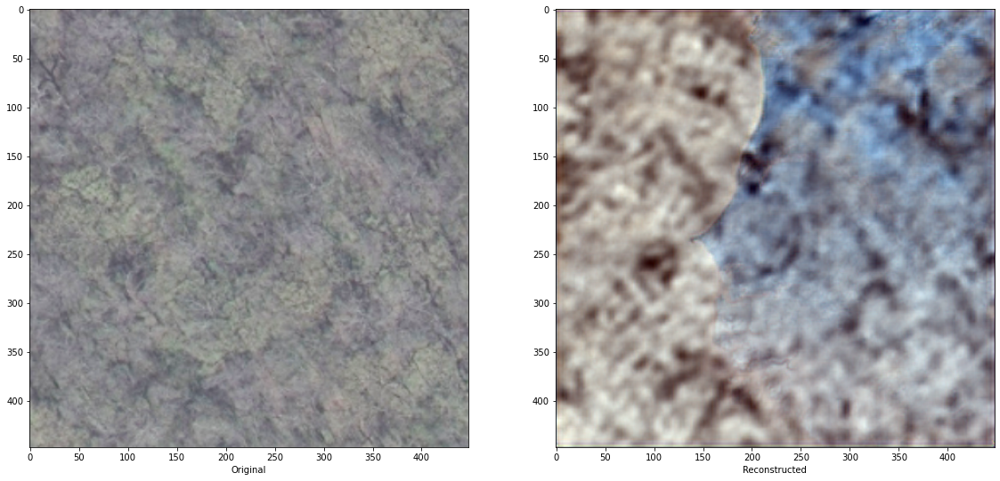

Orig  0.10240096038415253 0.9410764305722289
Gen  0.0 1.0


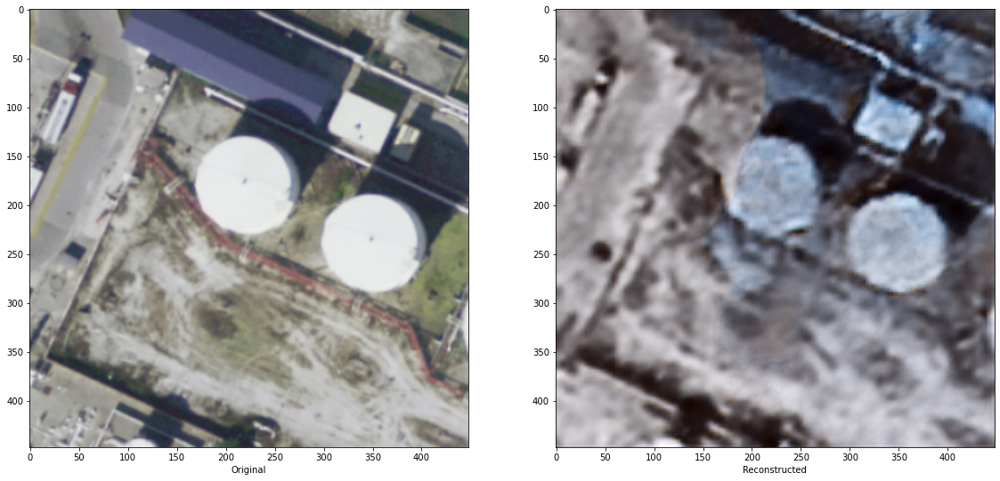

In [6]:
complete_model = load_model(OUTPUT_MODEL_PATH)
for i in range(10):
    index = np.random.randint(0, len(X_test_paths))
    img_orig = resize(plt.imread(X_test_paths[index])[:,:,:3], dims)
#     img_orig = np.load(X_test_paths[index])
    X_test_im = np.expand_dims(img_orig, 0)
    
    out_image = np.squeeze(complete_model.predict(X_test_im))

    im_min = out_image.min(axis=(0, 1), keepdims=True)
    im_max = out_image.max(axis=(0, 1), keepdims=True)
    out_image = (out_image - im_min) / (im_max - im_min)

    print("Orig ", np.min(X_test_im), np.max(X_test_im))
    print("Gen ", np.min(out_image), np.max(out_image))
    fig = plt.figure(figsize=(30, 60))
    plt.subplot(1, 3, 1)
    plt.xlabel("Original")
    plt.imshow(np.squeeze(X_test_im))
    plt.subplot(1, 3, 2)
    plt.xlabel("Reconstructed")
    plt.imshow(out_image)
    plt.savefig("reconstructed/%d.png"%(i))
    plt.show()